In [1]:
import sys
print(sys.version)


3.7.4 (default, Aug 13 2019, 15:17:50) 
[Clang 4.0.1 (tags/RELEASE_401/final)]


In [2]:
import pandas as pd
import numpy as np
from itertools import combinations 
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
import re
from scipy import stats

# GENERAL AUXILIARY FUNCTIONS

In [3]:
def filter_data(raw_data, intensity_kind):
    '''return dataframe with first 6 columns and only one kind of intensity (intensity_kind).'''
    df = raw_data.copy()
    colomns_to_filter = df.columns[6:]
    for col_name in colomns_to_filter:
        if intensity_kind not in col_name:
            df = df.drop(col_name, 1)
    return df 

def split_by_methods(df, intensity_kind, lysis_sign='C'):
    '''return two dataframes - one contains only lysis and one contains only epulse.'''
    epulse_df = df.copy()
    lysis_df = df.copy()
    for col_name in df.columns:
        res = re.search(intensity_kind, col_name)
        if res != None:
            res = re.search(lysis_sign, col_name)
            if res == None:  
                lysis_df = lysis_df.drop(col_name, 1)
            else:
                epulse_df = epulse_df.drop(col_name, 1)
    return epulse_df, lysis_df

def change_names_format(df):
    df.columns = ['{0}'.format(c.replace('_lysis','L').replace('C','')) for c in df.columns]
    return df

def order_data(raw_data,bcc,scc,bcc_scc,keratosis):
    '''order patients in spesific order for consistency and add the cancer type.'''
    patients = bcc.copy()
    patients.extend(scc)
    patients.extend(bcc_scc)
    patients.extend(keratosis)
    print(patients)
    df = raw_data.copy()
    df = df.reindex(columns=patients+['Gene names'])
    df.columns =['{0}{1}'.format('BCC ' if c in bcc else 'SCC ' if c in scc else 'SCC&BCC ' if c in bcc_scc else 'keratosis ' if c in keratosis else '', c) for c in df.columns]
    return df 

# READ AND ORDER THE DATASETS

# READ OLD  DATASET

In [4]:
raw_data = pd.read_excel('66957-67016-proteinGroups-genes (1).xlsx') 

In [5]:
intensity_kind = 'LFQ intensity'
correlation_type = 'pearson' # pearson or spearman.

df = filter_data(raw_data, intensity_kind)
df_epulse, df_lysis = split_by_methods(df, intensity_kind)

In [6]:
df_lysis

,Protein IDs,Majority protein IDs,Protein names,Gene names,Fasta headers,Number of proteins,LFQ intensity 12_C1_lysis,LFQ intensity 12_C3_lysis,LFQ intensity 12_C5_lysis,LFQ intensity 21_C1_lysis,...,LFQ intensity 31_C5_lysis,LFQ intensity 32_C1_lysis,LFQ intensity 32_C3_lysis,LFQ intensity 32_C5_lysis,LFQ intensity 33_C1_lysis,LFQ intensity 33_C3_lysis,LFQ intensity 33_C5_lysis,LFQ intensity 39_C1_lysis,LFQ intensity 39_C3_lysis,LFQ intensity 39_C5_lysis
0,Q09666;P48552,Q09666,Neuroblast differentiation-associated protein...,AHNAK,>sp|Q09666|AHNK_HUMAN Neuroblast differentiati...,2,70718000000,163510000000,105540000000,81946000000,...,95265000000,97821000000,96697000000,48880000000,69392000000,72462000000,93743000000,99208000000,105620000000,81277000000
1,Q15149,Q15149,Plectin,PLEC,>sp|Q15149|PLEC_HUMAN Plectin OS=Homo sapiens ...,1,25029000000,10561000000,36874000000,39506000000,...,44213000000,55278000000,114590000000,46377000000,30427000000,34619000000,37340000000,30454000000,47286000000,61731000000
2,P15924,P15924,Desmoplakin,DSP,>sp|P15924|DESP_HUMAN Desmoplakin OS=Homo sapi...,1,58723000000,24020000000,74943000000,150850000000,...,31302000000,128670000000,87856000000,75754000000,106330000000,80530000000,123550000000,68786000000,13003000000,89806000000
3,Q14204,Q14204,Cytoplasmic dynein 1 heavy chain 1,DYNC1H1,>sp|Q14204|DYHC1_HUMAN Cytoplasmic dynein 1 he...,1,13102000000,4497000000,7804400000,15407000000,...,6714700000,12165000000,10934000000,16158000000,11015000000,8103000000,6867800000,5579700000,5080000000,6844700000
4,P35579;REV__Q9UKV3,P35579,Myosin-9,MYH9,>sp|P35579|MYH9_HUMAN Myosin-9 OS=Homo sapiens...,2,79361000000,45754000000,57828000000,93212000000,...,129010000000,85606000000,91041000000,101650000000,67860000000,64688000000,61198000000,48632000000,81853000000,103140000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,Q9Y3E5,Q9Y3E5,"Peptidyl-tRNA hydrolase 2, mitochondrial",PTRH2,>sp|Q9Y3E5|PTH2_HUMAN Peptidyl-tRNA hydrolase ...,1,41026000,42218000,11768000,6940300,...,0,0,5976200,7062500,5468400,5662600,5795000,0,0,0
4613,Q9Y426,Q9Y426,C2 domain-containing protein 2,C2CD2,>sp|Q9Y426|C2CD2_HUMAN C2 domain-containing pr...,1,4951100,9385000,8384300,0,...,0,0,0,0,0,0,0,0,0,0
4614,Q9Y4J8,Q9Y4J8,Dystrobrevin alpha,DTNA,>sp|Q9Y4J8|DTNA_HUMAN Dystrobrevin alpha OS=Ho...,1,0,0,0,0,...,0,0,0,0,0,0,0,18529000,69791000,10380000
4615,Q9Y4Y9,Q9Y4Y9,U6 snRNA-associated Sm-like protein LSm5,LSM5,>sp|Q9Y4Y9|LSM5_HUMAN U6 snRNA-associated Sm-l...,1,6518100,5597600,0,0,...,0,4067700,0,0,0,0,6138600,4131400,3980300,0


In [7]:
df_lysis = change_names_format(df_lysis.iloc[:,6:])
df_lysis['Gene names'] = df['Gene names']
df_lysis

,LFQ intensity 12_1L,LFQ intensity 12_3L,LFQ intensity 12_5L,LFQ intensity 21_1L,LFQ intensity 21_3L,LFQ intensity 21_5L,LFQ intensity 25_1L,LFQ intensity 25_3L,LFQ intensity 25_5L,LFQ intensity 27_1L,...,LFQ intensity 32_1L,LFQ intensity 32_3L,LFQ intensity 32_5L,LFQ intensity 33_1L,LFQ intensity 33_3L,LFQ intensity 33_5L,LFQ intensity 39_1L,LFQ intensity 39_3L,LFQ intensity 39_5L,Gene names
0,70718000000,163510000000,105540000000,81946000000,92142000000,100770000000,108090000000,112820000000,149960000000,123760000000,...,97821000000,96697000000,48880000000,69392000000,72462000000,93743000000,99208000000,105620000000,81277000000,AHNAK
1,25029000000,10561000000,36874000000,39506000000,25639000000,38503000000,41246000000,65753000000,50908000000,99032000000,...,55278000000,114590000000,46377000000,30427000000,34619000000,37340000000,30454000000,47286000000,61731000000,PLEC
2,58723000000,24020000000,74943000000,150850000000,90107000000,122540000000,94289000000,157170000000,201700000000,69100000000,...,128670000000,87856000000,75754000000,106330000000,80530000000,123550000000,68786000000,13003000000,89806000000,DSP
3,13102000000,4497000000,7804400000,15407000000,5597700000,10244000000,11565000000,9379300000,12586000000,10173000000,...,12165000000,10934000000,16158000000,11015000000,8103000000,6867800000,5579700000,5080000000,6844700000,DYNC1H1
4,79361000000,45754000000,57828000000,93212000000,42220000000,47137000000,46569000000,48442000000,44259000000,88792000000,...,85606000000,91041000000,101650000000,67860000000,64688000000,61198000000,48632000000,81853000000,103140000000,MYH9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,41026000,42218000,11768000,6940300,0,0,0,0,0,6911800,...,0,5976200,7062500,5468400,5662600,5795000,0,0,0,PTRH2
4613,4951100,9385000,8384300,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,C2CD2
4614,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,18529000,69791000,10380000,DTNA
4615,6518100,5597600,0,0,0,0,0,0,0,5366200,...,4067700,0,0,0,0,6138600,4131400,3980300,0,LSM5


## READ NEW DATASET

In [8]:
raw_data_new = pd.read_excel('69619-42_68923-69012-proteinGroups-genes.xlsx') 

In [9]:
df_new = filter_data(raw_data_new, intensity_kind)
df_epulse_new, df_lysis_new = split_by_methods(df_new, intensity_kind, lysis_sign='L$')

In [10]:
df_lysis_new = df_lysis_new.drop(columns = ['Protein IDs','Majority protein IDs','Protein names','Fasta headers','Number of proteins'])
df_lysis_new

,Gene names,LFQ intensity 101_3L,LFQ intensity 103_1L,LFQ intensity 103_3L,LFQ intensity 103_5L,LFQ intensity 104_1L,LFQ intensity 104_3L,LFQ intensity 104_5L,LFQ intensity 105_3L,LFQ intensity 107_3L,...,LFQ intensity 90_1L,LFQ intensity 90_3L,LFQ intensity 90_5L,LFQ intensity 92_1L,LFQ intensity 92_3L,LFQ intensity 92_5L,LFQ intensity 95_3L,LFQ intensity 99_1L,LFQ intensity 99_3L,LFQ intensity 99_5L
0,PLEC,5400000000,6732100000,8591100000,6621900000,10261000000,7133900000,8117700000,23539000000,14431000000,...,5158100000,56662000000,5097700000,7587700000,31314000000,32445000000,15817000000,10684000000,15442000000,18195000000
1,AHNAK,1299700000,40634000000,11314000000,43387000000,29511000000,24994000000,26372000000,18719000000,33091000000,...,27678000000,30158000000,25774000000,33320000000,21664000000,26298000000,20466000000,27693000000,29079000000,27503000000
2,DSP,46581000000,4887500000,11065000000,3008200000,13992000000,13204000000,9721500000,23366000000,26881000000,...,20964000000,11593000000,9783100000,8532700000,19585000000,21346000000,12738000000,21866000000,24347000000,39550000000
3,MYH9,22514000000,12086000000,31806000000,10539000000,10966000000,23720000000,19732000000,51876000000,25863000000,...,15940000000,55539000000,17335000000,12844000000,40408000000,36458000000,23882000000,24527000000,32189000000,31252000000
4,DYNC1H1,859390000,2618200000,2283500000,2287100000,2059700000,2391400000,3049700000,3433900000,3022300000,...,1813700000,5053200000,1549900000,2421300000,1869500000,2335000000,2064600000,3313700000,4152500000,5293600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5331,PRKAB1,0,0,0,4606500,0,0,0,0,0,...,5038400,9704500,0,0,0,0,0,0,0,0
5332,RBM7,0,0,2608500,2808000,0,0,0,1864100,0,...,0,14251000,0,0,0,1708900,0,0,20716000,0
5333,SPCS1,0,51884000,33045000,68197000,0,46044000,26725000,24159000,0,...,0,73308000,0,27028000,19177000,0,22085000,0,0,0
5334,SLC4A4,0,0,0,0,0,101190000,123920000,0,0,...,0,0,0,0,0,0,0,0,0,0


## MERGE  DATASETS

In [11]:
merged_df_lysis = pd.merge(df_lysis, df_lysis_new, how ='outer', on =['Gene names']) 
display(merged_df_lysis)


,LFQ intensity 12_1L,LFQ intensity 12_3L,LFQ intensity 12_5L,LFQ intensity 21_1L,LFQ intensity 21_3L,LFQ intensity 21_5L,LFQ intensity 25_1L,LFQ intensity 25_3L,LFQ intensity 25_5L,LFQ intensity 27_1L,...,LFQ intensity 90_1L,LFQ intensity 90_3L,LFQ intensity 90_5L,LFQ intensity 92_1L,LFQ intensity 92_3L,LFQ intensity 92_5L,LFQ intensity 95_3L,LFQ intensity 99_1L,LFQ intensity 99_3L,LFQ intensity 99_5L
0,7.071800e+10,1.635100e+11,1.055400e+11,8.194600e+10,9.214200e+10,1.007700e+11,1.080900e+11,1.128200e+11,1.499600e+11,1.237600e+11,...,2.767800e+10,3.015800e+10,2.577400e+10,3.332000e+10,2.166400e+10,2.629800e+10,2.046600e+10,2.769300e+10,2.907900e+10,2.750300e+10
1,2.502900e+10,1.056100e+10,3.687400e+10,3.950600e+10,2.563900e+10,3.850300e+10,4.124600e+10,6.575300e+10,5.090800e+10,9.903200e+10,...,5.158100e+09,5.666200e+10,5.097700e+09,7.587700e+09,3.131400e+10,3.244500e+10,1.581700e+10,1.068400e+10,1.544200e+10,1.819500e+10
2,5.872300e+10,2.402000e+10,7.494300e+10,1.508500e+11,9.010700e+10,1.225400e+11,9.428900e+10,1.571700e+11,2.017000e+11,6.910000e+10,...,2.096400e+10,1.159300e+10,9.783100e+09,8.532700e+09,1.958500e+10,2.134600e+10,1.273800e+10,2.186600e+10,2.434700e+10,3.955000e+10
3,1.310200e+10,4.497000e+09,7.804400e+09,1.540700e+10,5.597700e+09,1.024400e+10,1.156500e+10,9.379300e+09,1.258600e+10,1.017300e+10,...,1.813700e+09,5.053200e+09,1.549900e+09,2.421300e+09,1.869500e+09,2.335000e+09,2.064600e+09,3.313700e+09,4.152500e+09,5.293600e+09
4,7.936100e+10,4.575400e+10,5.782800e+10,9.321200e+10,4.222000e+10,4.713700e+10,4.656900e+10,4.844200e+10,4.425900e+10,8.879200e+10,...,1.594000e+10,5.553900e+10,1.733500e+10,1.284400e+10,4.040800e+10,3.645800e+10,2.388200e+10,2.452700e+10,3.218900e+10,3.125200e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,2.893000e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.765500e+06
5778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5779,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.038400e+06,9.704500e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,7.330800e+07,0.000000e+00,2.702800e+07,1.917700e+07,0.000000e+00,2.208500e+07,0.000000e+00,0.000000e+00,0.000000e+00


# ADD CANCER TYPE AS PREFIX TO EACH SAMPLE (CANCER TYPE NO BCC-SUBTYPE!)

In [12]:
patients_details_df = pd.read_excel('proteomics 100 samples 02.2021.xlsx') 

In [13]:
patients_details_df

,Unnamed: 0,patient number,label,position,extraction method,Person diagnosis,sample diagnosis,Pathology description,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17
0,same patient 89+90,89,1_p,1.0,e-pulse,BCC,no tumor,"כתף שמאל. גידול במרכז, פריפריות ללא גידול",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,89,3_p,3.0,e-pulse,BCC,tumor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,89,5_p,5.0,e-pulse,BCC,no tumor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,89,1_L,1.0,lysis,BCC,no tumor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,89,3_L,3.0,lysis,BCC,tumor,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,NaN,104,3_p,3.0,e-pulse,BCC,?,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104,NaN,104,5_p,5.0,e-pulse,BCC,?,Superficial BCC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
105,NaN,104,1_L,1.0,lysis,BCC,?,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
106,NaN,104,3_L,3.0,lysis,BCC,?,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
def create_cancers_arrays(patients_details_df, intensity, bcc=[], scc=[], bcc_scc = [], keratosis = []):
    """Add samples names to each of the given cancer-types arrays (there are only bcc and scc samples details in the patients_details_df) """
    for i in patients_details_df.index:
        sample_row = patients_details_df.iloc[i, :]
        patient_number = sample_row['patient number']
        extraction_method = 'L' if sample_row['extraction method'] == 'lysis' else 'c'
        
        if extraction_method == 'L' and patient_number not in ['50H1','50H2']:
            position = int(sample_row['position'])
            if sample_row['Person diagnosis'] == 'BCC':
                bcc.append(f'{intensity} {patient_number}_{position}{extraction_method}')
            if sample_row['Person diagnosis'] == 'SCC':
                scc.append(f'{intensity} {patient_number}_{position}{extraction_method}')
    

# ORDER DATA COLUMNS BY CANCER TYPE

In [15]:
#BCC.
bcc = [f'{intensity_kind} 12_1L', f'{intensity_kind} 12_3L', f'{intensity_kind} 12_5L',
       f'{intensity_kind} 27_1L', f'{intensity_kind} 27_3L', f'{intensity_kind} 27_5L', 
       f'{intensity_kind} 39_1L', f'{intensity_kind} 39_3L', f'{intensity_kind} 39_5L']
#SCC.
scc = [f'{intensity_kind} 21_1L', f'{intensity_kind} 21_3L', f'{intensity_kind} 21_5L',
       f'{intensity_kind} 31_1L', f'{intensity_kind} 31_3L', f'{intensity_kind} 31_5L', 
       f'{intensity_kind} 32_1L', f'{intensity_kind} 32_3L', f'{intensity_kind} 32_5L']

#BCC&SCC.
bcc_scc = [f'{intensity_kind} 25_1L', f'{intensity_kind} 25_3L', f'{intensity_kind} 25_5L']

#KERATOSIS.
keratosis = [f'{intensity_kind} 33_1L', f'{intensity_kind} 33_3L', f'{intensity_kind} 33_5L']

create_cancers_arrays(patients_details_df, intensity_kind, bcc=bcc, scc=scc, bcc_scc = bcc_scc, keratosis = keratosis)

merged_df_lysis = order_data(merged_df_lysis, bcc, scc, bcc_scc, keratosis)
merged_df_lysis

['LFQ intensity 12_1L', 'LFQ intensity 12_3L', 'LFQ intensity 12_5L', 'LFQ intensity 27_1L', 'LFQ intensity 27_3L', 'LFQ intensity 27_5L', 'LFQ intensity 39_1L', 'LFQ intensity 39_3L', 'LFQ intensity 39_5L', 'LFQ intensity 89_1L', 'LFQ intensity 89_3L', 'LFQ intensity 89_5L', 'LFQ intensity 72_3L', 'LFQ intensity 103_1L', 'LFQ intensity 103_3L', 'LFQ intensity 103_5L', 'LFQ intensity 107_3L', 'LFQ intensity 111_3L', 'LFQ intensity 49_3L', 'LFQ intensity 105_3L', 'LFQ intensity 16_3L', 'LFQ intensity 99_1L', 'LFQ intensity 99_3L', 'LFQ intensity 99_5L', 'LFQ intensity 109_3L', 'LFQ intensity 73_1L', 'LFQ intensity 73_3L', 'LFQ intensity 73_5L', 'LFQ intensity 92_1L', 'LFQ intensity 92_3L', 'LFQ intensity 92_5L', 'LFQ intensity 54_1L', 'LFQ intensity 54_3L', 'LFQ intensity 54_5L', 'LFQ intensity 104_1L', 'LFQ intensity 104_3L', 'LFQ intensity 104_5L', 'LFQ intensity 21_1L', 'LFQ intensity 21_3L', 'LFQ intensity 21_5L', 'LFQ intensity 31_1L', 'LFQ intensity 31_3L', 'LFQ intensity 31_5L', 

,BCC LFQ intensity 12_1L,BCC LFQ intensity 12_3L,BCC LFQ intensity 12_5L,BCC LFQ intensity 27_1L,BCC LFQ intensity 27_3L,BCC LFQ intensity 27_5L,BCC LFQ intensity 39_1L,BCC LFQ intensity 39_3L,BCC LFQ intensity 39_5L,BCC LFQ intensity 89_1L,...,SCC LFQ intensity 60_3L,SCC LFQ intensity 95_3L,SCC LFQ intensity 101_3L,SCC&BCC LFQ intensity 25_1L,SCC&BCC LFQ intensity 25_3L,SCC&BCC LFQ intensity 25_5L,keratosis LFQ intensity 33_1L,keratosis LFQ intensity 33_3L,keratosis LFQ intensity 33_5L,Gene names
0,7.071800e+10,1.635100e+11,1.055400e+11,1.237600e+11,1.150800e+11,2.077000e+11,9.920800e+10,1.056200e+11,8.127700e+10,4.693600e+10,...,3.091400e+10,2.046600e+10,1.299700e+09,1.080900e+11,1.128200e+11,1.499600e+11,6.939200e+10,7.246200e+10,9.374300e+10,AHNAK
1,2.502900e+10,1.056100e+10,3.687400e+10,9.903200e+10,9.885000e+10,5.764500e+10,3.045400e+10,4.728600e+10,6.173100e+10,1.055300e+10,...,1.084300e+10,1.581700e+10,5.400000e+09,4.124600e+10,6.575300e+10,5.090800e+10,3.042700e+10,3.461900e+10,3.734000e+10,PLEC
2,5.872300e+10,2.402000e+10,7.494300e+10,6.910000e+10,9.698300e+10,9.792700e+10,6.878600e+10,1.300300e+10,8.980600e+10,4.582800e+10,...,1.297200e+10,1.273800e+10,4.658100e+10,9.428900e+10,1.571700e+11,2.017000e+11,1.063300e+11,8.053000e+10,1.235500e+11,DSP
3,1.310200e+10,4.497000e+09,7.804400e+09,1.017300e+10,1.408400e+10,1.288800e+10,5.579700e+09,5.080000e+09,6.844700e+09,3.966500e+09,...,3.285700e+09,2.064600e+09,8.593900e+08,1.156500e+10,9.379300e+09,1.258600e+10,1.101500e+10,8.103000e+09,6.867800e+09,DYNC1H1
4,7.936100e+10,4.575400e+10,5.782800e+10,8.879200e+10,6.510300e+10,1.006200e+11,4.863200e+10,8.185300e+10,1.031400e+11,1.497500e+10,...,1.919000e+10,2.388200e+10,2.251400e+10,4.656900e+10,4.844200e+10,4.425900e+10,6.786000e+10,6.468800e+10,6.119800e+10,MYH9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,CA5B
5778,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,HIF3A
5779,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,PRKAB1
5780,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,...,0.000000e+00,2.208500e+07,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,SPCS1


In [16]:
merged_df_lysis = merged_df_lysis[['Gene names'] + [c for c in merged_df_lysis.columns if c not in ['Gene names','Unnamed: 0']]]
merged_df_lysis

,Gene names,BCC LFQ intensity 12_1L,BCC LFQ intensity 12_3L,BCC LFQ intensity 12_5L,BCC LFQ intensity 27_1L,BCC LFQ intensity 27_3L,BCC LFQ intensity 27_5L,BCC LFQ intensity 39_1L,BCC LFQ intensity 39_3L,BCC LFQ intensity 39_5L,...,SCC LFQ intensity 45_3L,SCC LFQ intensity 60_3L,SCC LFQ intensity 95_3L,SCC LFQ intensity 101_3L,SCC&BCC LFQ intensity 25_1L,SCC&BCC LFQ intensity 25_3L,SCC&BCC LFQ intensity 25_5L,keratosis LFQ intensity 33_1L,keratosis LFQ intensity 33_3L,keratosis LFQ intensity 33_5L
0,AHNAK,7.071800e+10,1.635100e+11,1.055400e+11,1.237600e+11,1.150800e+11,2.077000e+11,9.920800e+10,1.056200e+11,8.127700e+10,...,2.147900e+10,3.091400e+10,2.046600e+10,1.299700e+09,1.080900e+11,1.128200e+11,1.499600e+11,6.939200e+10,7.246200e+10,9.374300e+10
1,PLEC,2.502900e+10,1.056100e+10,3.687400e+10,9.903200e+10,9.885000e+10,5.764500e+10,3.045400e+10,4.728600e+10,6.173100e+10,...,3.478300e+10,1.084300e+10,1.581700e+10,5.400000e+09,4.124600e+10,6.575300e+10,5.090800e+10,3.042700e+10,3.461900e+10,3.734000e+10
2,DSP,5.872300e+10,2.402000e+10,7.494300e+10,6.910000e+10,9.698300e+10,9.792700e+10,6.878600e+10,1.300300e+10,8.980600e+10,...,3.079100e+10,1.297200e+10,1.273800e+10,4.658100e+10,9.428900e+10,1.571700e+11,2.017000e+11,1.063300e+11,8.053000e+10,1.235500e+11
3,DYNC1H1,1.310200e+10,4.497000e+09,7.804400e+09,1.017300e+10,1.408400e+10,1.288800e+10,5.579700e+09,5.080000e+09,6.844700e+09,...,1.695100e+09,3.285700e+09,2.064600e+09,8.593900e+08,1.156500e+10,9.379300e+09,1.258600e+10,1.101500e+10,8.103000e+09,6.867800e+09
4,MYH9,7.936100e+10,4.575400e+10,5.782800e+10,8.879200e+10,6.510300e+10,1.006200e+11,4.863200e+10,8.185300e+10,1.031400e+11,...,2.560500e+10,1.919000e+10,2.388200e+10,2.251400e+10,4.656900e+10,4.844200e+10,4.425900e+10,6.786000e+10,6.468800e+10,6.119800e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,CA5B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN
5778,HIF3A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN
5779,PRKAB1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN
5780,SPCS1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000000e+00,0.000000e+00,2.208500e+07,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
merged_df_lysis.to_csv('proteinGroups-lysis-new-old-outer-join.csv')

# HEATMAPS  WITH ALL  PROTEINS (OLD AND NEW DATASETS)

## ALL CANCERS

In [18]:
merged_df_lysis = merged_df_lysis.fillna(0)
merged_df_lysis.iloc[:,1:]

,BCC LFQ intensity 12_1L,BCC LFQ intensity 12_3L,BCC LFQ intensity 12_5L,BCC LFQ intensity 27_1L,BCC LFQ intensity 27_3L,BCC LFQ intensity 27_5L,BCC LFQ intensity 39_1L,BCC LFQ intensity 39_3L,BCC LFQ intensity 39_5L,BCC LFQ intensity 89_1L,...,SCC LFQ intensity 45_3L,SCC LFQ intensity 60_3L,SCC LFQ intensity 95_3L,SCC LFQ intensity 101_3L,SCC&BCC LFQ intensity 25_1L,SCC&BCC LFQ intensity 25_3L,SCC&BCC LFQ intensity 25_5L,keratosis LFQ intensity 33_1L,keratosis LFQ intensity 33_3L,keratosis LFQ intensity 33_5L
0,7.071800e+10,1.635100e+11,1.055400e+11,1.237600e+11,1.150800e+11,2.077000e+11,9.920800e+10,1.056200e+11,8.127700e+10,4.693600e+10,...,2.147900e+10,3.091400e+10,2.046600e+10,1.299700e+09,1.080900e+11,1.128200e+11,1.499600e+11,6.939200e+10,7.246200e+10,9.374300e+10
1,2.502900e+10,1.056100e+10,3.687400e+10,9.903200e+10,9.885000e+10,5.764500e+10,3.045400e+10,4.728600e+10,6.173100e+10,1.055300e+10,...,3.478300e+10,1.084300e+10,1.581700e+10,5.400000e+09,4.124600e+10,6.575300e+10,5.090800e+10,3.042700e+10,3.461900e+10,3.734000e+10
2,5.872300e+10,2.402000e+10,7.494300e+10,6.910000e+10,9.698300e+10,9.792700e+10,6.878600e+10,1.300300e+10,8.980600e+10,4.582800e+10,...,3.079100e+10,1.297200e+10,1.273800e+10,4.658100e+10,9.428900e+10,1.571700e+11,2.017000e+11,1.063300e+11,8.053000e+10,1.235500e+11
3,1.310200e+10,4.497000e+09,7.804400e+09,1.017300e+10,1.408400e+10,1.288800e+10,5.579700e+09,5.080000e+09,6.844700e+09,3.966500e+09,...,1.695100e+09,3.285700e+09,2.064600e+09,8.593900e+08,1.156500e+10,9.379300e+09,1.258600e+10,1.101500e+10,8.103000e+09,6.867800e+09
4,7.936100e+10,4.575400e+10,5.782800e+10,8.879200e+10,6.510300e+10,1.006200e+11,4.863200e+10,8.185300e+10,1.031400e+11,1.497500e+10,...,2.560500e+10,1.919000e+10,2.388200e+10,2.251400e+10,4.656900e+10,4.844200e+10,4.425900e+10,6.786000e+10,6.468800e+10,6.119800e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5778,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5779,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5780,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,2.208500e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00


## TAKE ONLY BCC SAMPLES AND ORDER PATIENTS BY BCC SUB-TYPE.

In [19]:
infiltrative_bcc3 = [i for i in merged_df_lysis.columns if i.startswith('BCC') and any(x in i for x in ['103', '99', '39'])]
superficial_bcc3 = [i for i in merged_df_lysis.columns if i.startswith('BCC') and any(x in i for x in ['54', '104', '12'])]
nodular_bcc3 = [i for i in merged_df_lysis.columns if i.startswith('BCC') and any(x in i for x in ['73', '92', '27'])]
bcc3 = []
bcc3.extend(infiltrative_bcc3)
bcc3.extend(superficial_bcc3)
bcc3.extend(nodular_bcc3)
df_bcc3 = merged_df_lysis[bcc3]
# display(df_BCC3)
df_bcc3.columns = ['{0}{1}'.format('Infiltrative ' if c in infiltrative_bcc3 else 'Superficial ' if c in superficial_bcc3 else 'Nodular ',c) for c in bcc3]
display(df_bcc3)


,Infiltrative BCC LFQ intensity 39_1L,Infiltrative BCC LFQ intensity 39_3L,Infiltrative BCC LFQ intensity 39_5L,Infiltrative BCC LFQ intensity 103_1L,Infiltrative BCC LFQ intensity 103_3L,Infiltrative BCC LFQ intensity 103_5L,Infiltrative BCC LFQ intensity 99_1L,Infiltrative BCC LFQ intensity 99_3L,Infiltrative BCC LFQ intensity 99_5L,Superficial BCC LFQ intensity 12_1L,...,Superficial BCC LFQ intensity 104_5L,Nodular BCC LFQ intensity 27_1L,Nodular BCC LFQ intensity 27_3L,Nodular BCC LFQ intensity 27_5L,Nodular BCC LFQ intensity 73_1L,Nodular BCC LFQ intensity 73_3L,Nodular BCC LFQ intensity 73_5L,Nodular BCC LFQ intensity 92_1L,Nodular BCC LFQ intensity 92_3L,Nodular BCC LFQ intensity 92_5L
0,9.920800e+10,1.056200e+11,8.127700e+10,4.063400e+10,1.131400e+10,4.338700e+10,2.769300e+10,2.907900e+10,2.750300e+10,7.071800e+10,...,2.637200e+10,1.237600e+11,1.150800e+11,2.077000e+11,3.954600e+10,4.659200e+10,3.894400e+10,3.332000e+10,2.166400e+10,2.629800e+10
1,3.045400e+10,4.728600e+10,6.173100e+10,6.732100e+09,8.591100e+09,6.621900e+09,1.068400e+10,1.544200e+10,1.819500e+10,2.502900e+10,...,8.117700e+09,9.903200e+10,9.885000e+10,5.764500e+10,2.391100e+10,2.431700e+10,3.019000e+10,7.587700e+09,3.131400e+10,3.244500e+10
2,6.878600e+10,1.300300e+10,8.980600e+10,4.887500e+09,1.106500e+10,3.008200e+09,2.186600e+10,2.434700e+10,3.955000e+10,5.872300e+10,...,9.721500e+09,6.910000e+10,9.698300e+10,9.792700e+10,1.591200e+10,1.947200e+10,3.197200e+10,8.532700e+09,1.958500e+10,2.134600e+10
3,5.579700e+09,5.080000e+09,6.844700e+09,2.618200e+09,2.283500e+09,2.287100e+09,3.313700e+09,4.152500e+09,5.293600e+09,1.310200e+10,...,3.049700e+09,1.017300e+10,1.408400e+10,1.288800e+10,2.861300e+09,3.111300e+09,4.216900e+09,2.421300e+09,1.869500e+09,2.335000e+09
4,4.863200e+10,8.185300e+10,1.031400e+11,1.208600e+10,3.180600e+10,1.053900e+10,2.452700e+10,3.218900e+10,3.125200e+10,7.936100e+10,...,1.973200e+10,8.879200e+10,6.510300e+10,1.006200e+11,5.720100e+10,4.627900e+10,6.294800e+10,1.284400e+10,4.040800e+10,3.645800e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.698900e+06,0.000000e+00,0.000000e+00,2.765500e+06,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.153500e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5778,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5779,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.606500e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5780,0.000000e+00,0.000000e+00,0.000000e+00,5.188400e+07,3.304500e+07,6.819700e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.672500e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.535200e+07,0.000000e+00,6.454500e+06,2.702800e+07,1.917700e+07,0.000000e+00


# SHORTCUT PATIENTS NAMES.

In [20]:
new_columns = []
for col in df_bcc3.columns:
    new_col = col.replace("Infiltrative", "I")
    new_col = new_col.replace("Superficial", "S")
    new_col = new_col.replace("Nodular", "N")
    new_col = new_col.replace("1L", "I")
    new_col = new_col.replace("3L", "II")
    new_col = new_col.replace("5L", "III")
    new_col = new_col.replace("39", "1")
    new_col = new_col.replace("103", "2")
    new_col = new_col.replace("99", "3")
    new_col = new_col.replace("12", "4")
    new_col = new_col.replace("54", "5")
    new_col = new_col.replace("104", "6")
    new_col = new_col.replace("27", "7")
    new_col = new_col.replace("73", "8")
    new_col = new_col.replace("92", "9")
    new_col = new_col.replace(" BCC LFQ intensity ", " ")
    new_col += ' '
    #new_col = new_col.replace(" ", "")
    new_columns.append(new_col)
df_bcc3.columns = new_columns    
display(df_bcc3)

,I 1_I,I 1_II,I 1_III,I 2_I,I 2_II,I 2_III,I 3_I,I 3_II,I 3_III,S 4_I,...,S 6_III,N 7_I,N 7_II,N 7_III,N 8_I,N 8_II,N 8_III,N 9_I,N 9_II,N 9_III
0,9.920800e+10,1.056200e+11,8.127700e+10,4.063400e+10,1.131400e+10,4.338700e+10,2.769300e+10,2.907900e+10,2.750300e+10,7.071800e+10,...,2.637200e+10,1.237600e+11,1.150800e+11,2.077000e+11,3.954600e+10,4.659200e+10,3.894400e+10,3.332000e+10,2.166400e+10,2.629800e+10
1,3.045400e+10,4.728600e+10,6.173100e+10,6.732100e+09,8.591100e+09,6.621900e+09,1.068400e+10,1.544200e+10,1.819500e+10,2.502900e+10,...,8.117700e+09,9.903200e+10,9.885000e+10,5.764500e+10,2.391100e+10,2.431700e+10,3.019000e+10,7.587700e+09,3.131400e+10,3.244500e+10
2,6.878600e+10,1.300300e+10,8.980600e+10,4.887500e+09,1.106500e+10,3.008200e+09,2.186600e+10,2.434700e+10,3.955000e+10,5.872300e+10,...,9.721500e+09,6.910000e+10,9.698300e+10,9.792700e+10,1.591200e+10,1.947200e+10,3.197200e+10,8.532700e+09,1.958500e+10,2.134600e+10
3,5.579700e+09,5.080000e+09,6.844700e+09,2.618200e+09,2.283500e+09,2.287100e+09,3.313700e+09,4.152500e+09,5.293600e+09,1.310200e+10,...,3.049700e+09,1.017300e+10,1.408400e+10,1.288800e+10,2.861300e+09,3.111300e+09,4.216900e+09,2.421300e+09,1.869500e+09,2.335000e+09
4,4.863200e+10,8.185300e+10,1.031400e+11,1.208600e+10,3.180600e+10,1.053900e+10,2.452700e+10,3.218900e+10,3.125200e+10,7.936100e+10,...,1.973200e+10,8.879200e+10,6.510300e+10,1.006200e+11,5.720100e+10,4.627900e+10,6.294800e+10,1.284400e+10,4.040800e+10,3.645800e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5777,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.698900e+06,0.000000e+00,0.000000e+00,2.765500e+06,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.153500e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5778,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5779,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.606500e+06,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
5780,0.000000e+00,0.000000e+00,0.000000e+00,5.188400e+07,3.304500e+07,6.819700e+07,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,2.672500e+07,0.000000e+00,0.000000e+00,0.000000e+00,1.535200e+07,0.000000e+00,6.454500e+06,2.702800e+07,1.917700e+07,0.000000e+00


# SHOW AMOUNT OF PROTEINS WITH LFQ-INTENSITY > 0 IN EACH SAMPLE.

In [21]:
a =df_bcc3.copy()
a[a>0]=1
a.sum(0)

I 1_I       3656.0
I 1_II      3600.0
I 1_III     3884.0
I 2_I       4135.0
I 2_II      3990.0
I 2_III     4080.0
I 3_I       3881.0
I 3_II      4240.0
I 3_III     3957.0
S 4_I       4129.0
S 4_II      4026.0
S 4_III     3974.0
S 5_I       2924.0
S 5_II      3107.0
S 5_III     3399.0
S 6_I       3315.0
S 6_II      3929.0
S 6_III     3741.0
N 7_I       3684.0
N 7_II      3300.0
N 7_III     3632.0
N 8_I       4172.0
N 8_II      4069.0
N 8_III     4251.0
N 9_I       4016.0
N 9_II      4122.0
N 9_III     4158.0
dtype: float64

# HEATMAP VISUALIZATION

In [22]:
#df_corr_bcc3 = df_bcc3.corr(method=correlation_type,min_periods = 2349)
from scipy import stats
def get_spearman_pearson_corr_matrix(df_bcc3):
    mask_spearman=np.zeros((df_bcc3.shape[1],df_bcc3.shape[1]))
    
    mask_pearson = np.zeros((df_bcc3.shape[1],df_bcc3.shape[1]))
    
    df = pd.DataFrame(index=df_bcc3.columns,columns=df_bcc3.columns,dtype=float)
    for i in range(df_bcc3.shape[1]):
        for j in range(df_bcc3.shape[1]):
            if i < j:
                corr, p_val = stats.pearsonr(df_bcc3.iloc[:,i],df_bcc3.iloc[:,j])
                mask_pearson[j,i]= 1
            elif i > j:
                corr, p_val = stats.spearmanr(df_bcc3.iloc[:,i],df_bcc3.iloc[:,j])
                mask_spearman[j,i]=1 
            else:
                corr = 0.7
            
            df.iloc[j,i] = corr
    return df, mask_pearson, mask_spearman


df_corr_bcc3, mask_pearson, mask_spearman = get_spearman_pearson_corr_matrix(df_bcc3)
sns.set(font_scale=9)


In [23]:
import numpy as np
import matplotlib.pyplot as plt


sns.set(font_scale=19)


# Make data for display
red = np.ma.masked_where(mask_pearson,a=df_corr_bcc3)

blue = np.ma.masked_where(mask_spearman,a=df_corr_bcc3)


# Make a side-by-side plot
fig, ax = plt.subplots()
redmesh = ax.pcolormesh(red, cmap='Purples')
bluemesh = ax.pcolormesh(blue, cmap='Greens')


# Make things a touch fancier
ax.tick_params(axis='x', labelrotation=90)
short_col_names = [col_name.replace('BCC ','').replace('intensity ','').replace('LFQ ','').replace('L','  ') for col_name in df_bcc3.columns]
ax.set(xticks=np.arange(1,df_bcc3.shape[1]+1)-0.5,
       yticks=np.arange(1,df_bcc3.shape[1]+1)-0.5,
       xticklabels=short_col_names,
       yticklabels=short_col_names)

ax.set_title('Spearman and Pearson Heatmap', y=1.07,size=400)
ax.xaxis.tick_bottom()
ax.yaxis.tick_left()
ax.tick_params(direction='out')

# Add dual colorbars
fig.subplots_adjust(bottom=0.05, right=0.78, top=0.88)
cbar = fig.colorbar(redmesh, cax=fig.add_axes([0.81, 0.05, 0.04, 0.83]))
cbar.ax.text(0.55, 0.11, 'spearman', rotation=90, ha='center', va='center',
             transform=cbar.ax.transAxes, size=300,color='gray')
cbar = fig.colorbar(bluemesh, cax=fig.add_axes([0.9, 0.05, 0.04, 0.83]))
cbar.ax.text(0.55, 0.1, 'pearson', rotation=90, ha='center', va='center',
             transform=cbar.ax.transAxes, size=300,color='gray')



# Make the grouping clearer
ax.grid(axis='x', ls='-', color='gray', which='minor')
ax.grid(axis='y', ls=':', color='gray')
ax.invert_yaxis()

fig.set_size_inches((400,200))
color_treshold = df_corr_bcc3.mean().mean()
for i in range(df_bcc3.shape[1]):
    for j in range(df_bcc3.shape[1]):
        text = ax.text(j+0.5, i + 0.5, '{:.2f}'.format(df_corr_bcc3.iloc[i, j]),
                       ha="center", va="center" , color='white' if df_corr_bcc3.iloc[i, j] > color_treshold else 'black')
fig.set_size_inches((350,200))
plt.show()

# HISTOGRAMS

# READ CONTROL GROUP DATA (SAME SAMPLE, 5 DIFFERENT LCMS OUTPUTS)

In [24]:
raw_data_same = pd.read_excel('69010-proteinGroups-genes.xlsx') 

In [25]:
df_same = filter_data(raw_data_same, intensity_kind)
df_same = df_same.dropna()
display(df_same.iloc[:,6:])
a=df_same.iloc[:,6:].copy()
a[a>0]=1
a.sum(0)

,LFQ intensity L3_95_a,LFQ intensity L3_95_b1,LFQ intensity L3_95_b2,LFQ intensity L3_95_b3,LFQ intensity L3_95_b4,LFQ intensity L3_95_b5
0,6.102800e+09,5.890000e+09,5.954300e+09,5.997500e+09,5.786300e+09,5.990100e+09
1,6.204600e+09,5.004100e+09,5.013600e+09,5.184200e+09,4.608100e+09,4.568600e+09
2,4.682100e+09,4.604500e+09,4.683600e+09,4.628300e+09,4.542700e+09,4.792100e+09
3,9.631600e+09,9.867000e+09,1.000500e+10,1.025100e+10,9.505300e+09,9.747300e+09
4,3.379100e+09,3.118000e+09,3.116700e+09,3.075400e+09,3.084600e+09,3.088200e+09
...,...,...,...,...,...,...
2344,0.000000e+00,1.882700e+06,1.882400e+06,1.718600e+06,1.361800e+06,0.000000e+00
2345,0.000000e+00,5.109900e+06,0.000000e+00,7.651700e+06,5.156200e+06,5.114000e+06
2346,0.000000e+00,3.023100e+06,4.117700e+06,3.706300e+06,1.452500e+07,8.468200e+06
2347,6.298700e+06,0.000000e+00,7.920000e+06,5.288100e+06,6.025200e+06,7.384500e+06


LFQ intensity L3_95_a     2149.0
LFQ intensity L3_95_b1    2214.0
LFQ intensity L3_95_b2    2210.0
LFQ intensity L3_95_b3    2230.0
LFQ intensity L3_95_b4    2198.0
LFQ intensity L3_95_b5    2202.0
dtype: float64

In [26]:
df_same_corr = df_same.iloc[:,7:].corr(method=correlation_type, min_periods = 2349)
df_same_corr     

,LFQ intensity L3_95_b1,LFQ intensity L3_95_b2,LFQ intensity L3_95_b3,LFQ intensity L3_95_b4,LFQ intensity L3_95_b5
LFQ intensity L3_95_b1,1.000000,0.998585,0.999473,0.998846,0.998828
LFQ intensity L3_95_b2,0.998585,1.000000,0.998551,0.997954,0.998082
LFQ intensity L3_95_b3,0.999473,0.998551,1.000000,0.998867,0.999099
LFQ intensity L3_95_b4,0.998846,0.997954,0.998867,1.000000,0.999737
LFQ intensity L3_95_b5,0.998828,0.998082,0.999099,0.999737,1.000000


In [27]:
same_sample_hist = []
for i in range(df_same_corr.shape[0]):
    for j in range(i+1, df_same_corr.shape[1]):
        same_sample_hist.append(df_same_corr.iloc[i,j])
same_sample_hist

[0.9985851050434286,
 0.9994730948980296,
 0.9988458753952523,
 0.9988275308866078,
 0.9985510313210515,
 0.9979544959046049,
 0.9980823110702324,
 0.9988668087599002,
 0.9990993269893342,
 0.9997372262498563]

# GET EACH SUBGROUP CORRELATIONS AS AN ARRAY

In [28]:
def get_inter_intra_values(df_corr):
    inter_hist = []
    intra_hist = []
    i=0
    while i < df_corr.shape[0]:
        sample_name = df_corr.index[i]
        for intra_end in [3,2,1]:
            intra_hist.extend(df_corr.iloc[i, (i + 1):(i + intra_end)])
            inter_hist.extend(df_corr.iloc[i, (i + intra_end):])
            i += 1
    display('inter histogram len:',len(inter_hist))
    display('intra histogram len:',len(intra_hist))
    return inter_hist,intra_hist

df_corr = df_corr_bcc3

if correlation_type == 'pearson':
    df_corr = df_bcc3.corr('pearson')

    
sample_amount = df_corr.shape[0]
inter_hist_i,intra_hist_i = get_inter_intra_values(df_corr.iloc[:sample_amount//3, :sample_amount//3])
inter_hist_s,intra_hist_s = get_inter_intra_values(df_corr.iloc[sample_amount//3:2*sample_amount//3, sample_amount//3:2*sample_amount//3])
inter_hist_n,intra_hist_n = get_inter_intra_values(df_corr.iloc[2*sample_amount//3:, 2*sample_amount//3:])

inter_hist_s_i = df_corr.iloc[:sample_amount//3, sample_amount//3: 2 * sample_amount//3].values.flatten()
inter_hist_i_n = df_corr.iloc[:sample_amount//3, 2* sample_amount//3 : 3 * sample_amount//3].values.flatten()
inter_hist_s_n = df_corr.iloc[sample_amount//3:2*sample_amount//3, 2* sample_amount//3 : 3 * sample_amount//3].values.flatten()

labels_inter = []
inter_hist = []
inter_hist.extend(inter_hist_i)
labels_inter.extend(len(inter_hist_i)*['inter patient i'])

inter_hist.extend(inter_hist_s)
labels_inter.extend(len(inter_hist_s)*['inter patient s'])

inter_hist.extend(inter_hist_n)
labels_inter.extend(len(inter_hist_n)*['inter patient n'])

inter_hist.extend(inter_hist_s_i)
labels_inter.extend(len(inter_hist_s_i)*['inter patient s-i'])

inter_hist.extend(inter_hist_i_n)
labels_inter.extend(len(inter_hist_i_n)*['inter patient i-n'])

inter_hist.extend(inter_hist_s_n)
labels_inter.extend(len(inter_hist_s_n)*['inter patient s-n'])

labels_intra =[]
intra_hist = []
intra_hist.extend(intra_hist_i)
labels_intra.extend(len(intra_hist_i)*['blue'])

intra_hist.extend(intra_hist_s)
labels_intra.extend(len(intra_hist_s)*['yellow'])

intra_hist.extend(intra_hist_n)
labels_intra.extend(len(intra_hist_n)*['black'])
#hists_df = pd.DataFrame()



'inter histogram len:'

27

'intra histogram len:'

9

'inter histogram len:'

27

'intra histogram len:'

9

'inter histogram len:'

27

'intra histogram len:'

9

# BASIC HISTOGRAM VISUALIZATION.

[0.3   0.335 0.37  0.405 0.44  0.475 0.51  0.545 0.58  0.615 0.65  0.685
 0.72  0.755 0.79  0.825 0.86  0.895 0.93  0.965 1.   ]


/Users/ilaigenishmac/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  


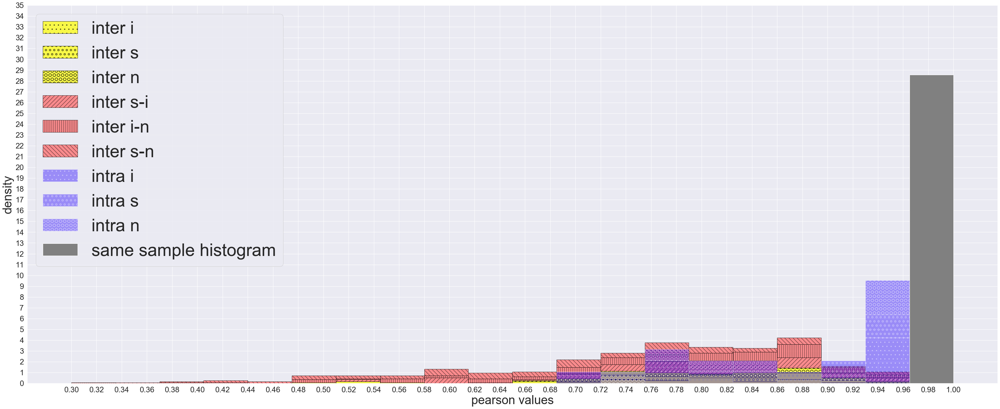

In [29]:
plt.figure(figsize=(50,20))

if correlation_type == 'spearman':
    plot_start_range =0.6


if correlation_type == 'pearson':
    plot_start_range =0.3
    
bins=np.histogram(np.hstack((inter_hist,intra_hist,same_sample_hist)), bins=20,range=(plot_start_range,1))[1] #get the bin edges
print(bins)
sns.set(font_scale=2)
    
inter_hist_ = np.array([inter_hist_i,inter_hist_s,inter_hist_n,inter_hist_s_i,inter_hist_i_n,inter_hist_s_n]).T

n, bins, patches = plt.hist(inter_hist_, density=True, bins =bins, stacked=True, alpha = 0.7,
         color=['yellow','yellow','yellow','#FF6161', '#FF6161','#FF6161'],
         label=["inter i","inter s","inter n","inter s-i","inter i-n","inter s-n"],
         hatch = "O",edgecolor='black')

hatches = [ '.', 'o', 'O','//','||', '\\\\']
for patch_set, hatch in zip(patches, hatches):
    for patch in patch_set.patches:
        patch.set_hatch(hatch)
        
n, bins, patches = plt.hist([intra_hist_i,intra_hist_s,intra_hist_n], 
         density=True,bins =bins,stacked=True, alpha = 0.4,
         color=['#2200FF','#2200FF','#2200FF'],
         label=["intra i","intra s","intra n"],
         hatch = "x",edgecolor='white')

hatches = [ '.', 'o', 'O']
for patch_set, hatch in zip(patches, hatches):
    for patch in patch_set.patches:
        patch.set_hatch(hatch)
        

plt.hist(same_sample_hist, density=True, color='gray',bins =bins,alpha = 1,label="same sample histogram")     


plt.legend(prop={'size': 50})
plt.xlabel(f'{correlation_type} values',size = 35)
plt.ylabel('density',size = 35)

if correlation_type == 'spearman':
    plt.xticks(np.linspace(start=0.6,stop=1.0,num=21,endpoint=True))
    plt.yticks(np.linspace(start=0,stop=36,num=19,endpoint=True))


if correlation_type == 'pearson':
    plt.xticks(np.linspace(start=0.3,stop=1.0,num=36,endpoint=True))
    plt.yticks(np.linspace(start=0,stop=35,num=36,endpoint=True))

plt.show()


# FINAL HISTOGRAM VISUALIZATION.

# HISTOGRAM VISUALIZATION AUXILIARY FUNCTIONS

In [31]:
def get_hist(values, bins=40, plot_range=(0.6,1), weights=None):
    """
    given array of correlations (values) the function split the correlations
    to bins and amount of correlation in each bin.
    retrun: two dim array - hist[0][i] the amount of values in bin i, hist[1][i]- the bin start (bin end = hist[1][i+1]).
    """
    if weights is None:
        res = np.histogram(values, bins=bins,range=plot_range)
    else:
        res = np.histogram(values, bins=bins,range=plot_range,weights=weights)
        
    hist = []
    hist.append(np.array([int(i) for i in res[0]]))
    hist.append(np.array([float(i) for i in res[1]]))
    return hist

def get_norm_denominator(hist1,hist2,hist3,bins_width):
    """normalize the histogram of intra patients"""
    denominator=hist1+hist2+hist3
    print('aaaaa', np.array([1 if i == 0 else i for i in denominator]))
    res = sum(denominator)#*bins_width
    return res

def get_norm_denominator6(hist1,hist2,hist3,hist4,hist5,hist6,bins_width):
    """normalize the histogram of inter patients"""
    denominator = hist1+hist2+hist3+hist4+hist5+hist6
    print('aaaaa', np.array([1 if i == 0 else i for i in denominator]))
    res = sum(denominator)#*bins_width
    return res


def get_baiysian(group,denominator):
    res=[]
    for g,d in zip (group,denominator):
        if g==d==0:
            res.append(0.5)
        else:
            res.append(g/d)
    return res
    

aaaaa [ 1  1  1  1  1  2  1  2  1  6  4  5  3  6 13  4  7  5  4 13 17 18 19 23
 24 21 24 21 28 23  8 14  5  1  1]
[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 3,
       2, 0, 5, 2, 2, 1, 2, 2, 1, 0, 0, 0, 0]), array([0.3 , 0.32, 0.34, 0.36, 0.38, 0.4 , 0.42, 0.44, 0.46, 0.48, 0.5 ,
       0.52, 0.54, 0.56, 0.58, 0.6 , 0.62, 0.64, 0.66, 0.68, 0.7 , 0.72,
       0.74, 0.76, 0.78, 0.8 , 0.82, 0.84, 0.86, 0.88, 0.9 , 0.92, 0.94,
       0.96, 0.98, 1.  ])]
aaaaa [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 2 1 1 1 1 3 5 7 2]
[0.3  0.32 0.34 0.36 0.38 0.4  0.42 0.44 0.46 0.48 0.5  0.52 0.54 0.56
 0.58 0.6  0.62 0.64 0.66 0.68 0.7  0.72 0.74 0.76 0.78 0.8  0.82 0.84
 0.86 0.88 0.9  0.92 0.94 0.96 0.98 1.  ]


array([0.        , 0.00308642, 0.00308642, 0.00308642, 0.00308642,
       0.00617284, 0.00308642, 0.00617284, 0.        , 0.01851852,
       0.01234568, 0.0154321 , 0.00925926, 0.01851852, 0.04012346,
       0.01234568, 0.02160494, 0.0154321 , 0.01234568, 0.04012346,
       0.05246914, 0.05555556, 0.05864198, 0.07098765, 0.07407407,
       0.06481481, 0.07407407, 0.06481481, 0.08641975, 0.07098765,
       0.02469136, 0.04320988, 0.0154321 , 0.        , 0.        ])

,bins,bin height - inter patients,bin height - intra patient,p(corr ∈ inter)
0,"[0.30, 0.32)",0,0,0.5
1,"[0.32, 0.34)",0.003,0,1
2,"[0.34, 0.36)",0.003,0,1
3,"[0.36, 0.38)",0.003,0,1
4,"[0.38, 0.40)",0.003,0,1
5,"[0.40, 0.42)",0.006,0,1
6,"[0.42, 0.44)",0.003,0,1
7,"[0.44, 0.46)",0.006,0,1
8,"[0.46, 0.48)",0,0,0.5
9,"[0.48, 0.50)",0.019,0,1


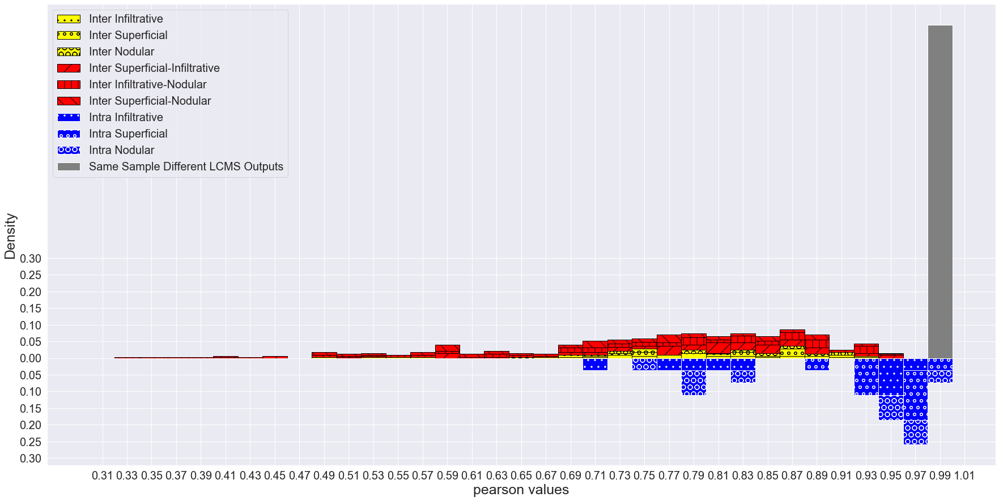

In [32]:
y1 = np.array(inter_hist_i)
y2 = np.array(inter_hist_s)
y3 = np.array(inter_hist_n)
y4 = np.array(inter_hist_s_i)
y5 = np.array(inter_hist_i_n)
y6 = np.array(inter_hist_s_n)
y7 = np.array(intra_hist_i)
y8 = np.array(intra_hist_s)
y9 = np.array(intra_hist_n)
y10 = np.array(same_sample_hist)

plt.figure(figsize=(30,15))
if correlation_type == 'spearman':
    bins_number = 20
    plot_start_range = 0.6


if correlation_type == 'pearson':
    bins_number = 35
    plot_start_range = 0.3
    
barWidth=0.02
bins_width= 0.02


hist_inter_i = get_hist(y1, bins=bins_number,plot_range=(plot_start_range,1))
hist_inter_s = get_hist(y2, bins=bins_number,plot_range=(plot_start_range,1))
hist_inter_n = get_hist(y3, bins=bins_number,plot_range=(plot_start_range,1))

hist_inter_s_i = get_hist(y4, bins=bins_number,plot_range=(plot_start_range,1))
hist_inter_i_n = get_hist(y5, bins=bins_number,plot_range=(plot_start_range,1))
hist_inter_s_n = get_hist(y6, bins=bins_number,plot_range=(plot_start_range,1))


denominator6 = get_norm_denominator6(hist_inter_i[0],hist_inter_s[0],hist_inter_n[0],
                                     hist_inter_s_i[0],hist_inter_i_n[0],hist_inter_s_n[0],bins_width)
height_i =hist_inter_i[0]/denominator6
height_s =hist_inter_s[0]/denominator6
height_n =hist_inter_n[0]/denominator6

height_inter = (hist_inter_i[0] + hist_inter_s[0] + hist_inter_n[0] + hist_inter_s_i[0] + hist_inter_i_n[0] + hist_inter_s_n[0])/\
               (hist_inter_i[0] + hist_inter_s[0] + hist_inter_n[0] + hist_inter_s_i[0] + hist_inter_i_n[0] + hist_inter_s_n[0]).sum()

print(hist_inter_i)
plt.bar(x=hist_inter_i[1][:-1] + bins_width/2,
        height=height_i,
        width=barWidth, 
        label='Inter Infiltrative',
        color='yellow',
        edgecolor='black',
        linewidth=1,
        hatch='.')


plt.bar(x=hist_inter_s[1][:-1] + bins_width/2,
        height=height_s,
        bottom=height_i,
        width=barWidth, 
        label='Inter Superficial',
        color='yellow',
        edgecolor='black',
        linewidth=1,
        hatch='o')


plt.bar(x=hist_inter_n[1][:-1] + bins_width/2,
        height=height_n,
        bottom=height_i+height_s,
        width=barWidth, 
        label='Inter Nodular',
        color='yellow', 
        edgecolor='black',
        linewidth=1,
        hatch='O')


height_s_i = hist_inter_s_i[0]/denominator6
height_i_n = hist_inter_i_n[0]/denominator6
height_s_n = hist_inter_s_n[0]/denominator6


start = height_i+height_s + height_n
plt.bar(x=hist_inter_s_i[1][:-1] + bins_width/2,
        height=height_s_i,
        width=barWidth,
        bottom = start,
        label='Inter Superficial-Infiltrative',
        color='red', 
        edgecolor='black',
        linewidth=1,
        hatch='/')


plt.bar(x=hist_inter_i_n[1][:-1] + bins_width/2,
        height=height_i_n,
        bottom= start + height_s_i,
        width=barWidth, 
        label='Inter Infiltrative-Nodular',
        color='red', 
        edgecolor='black',
        linewidth=1,
        hatch='|')


plt.bar(x=hist_inter_s_n[1][:-1] + bins_width/2,
        height=height_s_n,
        bottom=start + height_s_i + height_i_n,
        width=barWidth, 
        label='Inter Superficial-Nodular',
        color='red', 
        edgecolor='black',
        linewidth=1,
        hatch='\\')

hist_intra_i = get_hist(y7, bins=bins_number,plot_range=(plot_start_range,1))
hist_intra_s = get_hist(y8, bins=bins_number,plot_range=(plot_start_range,1))
hist_intra_n = get_hist(y9, bins=bins_number,plot_range=(plot_start_range,1))

height_intra = (hist_intra_i[0] + hist_intra_s[0] + hist_intra_n[0])/(hist_intra_i[0] + hist_intra_s[0] + hist_intra_n[0]).sum()

denominator3 = get_norm_denominator(hist_intra_i[0],hist_intra_s[0],hist_intra_n[0],bins_width)

height_i =hist_intra_i[0]/denominator3
height_s =hist_intra_s[0]/denominator3
height_n =hist_intra_n[0]/denominator3

plt.bar(x=hist_intra_i[1][:-1] + bins_width/2 ,
        height=-height_i,
        width=barWidth, 
        label='Intra Infiltrative',
        color='blue', 
        edgecolor='white',
        linewidth=1,
        hatch='.')


plt.bar(x=hist_intra_s[1][:-1] + bins_width/2,
        height=-height_s ,
        bottom=-height_i,
        width=barWidth, 
        label='Intra Superficial',
        color='blue', 
        edgecolor='white',
        linewidth=1,
        hatch='o')


plt.bar(x=hist_intra_n[1][:-1] + bins_width/2,
        height=-height_n,
        bottom=-height_i-height_s,
        width=barWidth, 
        label='Intra Nodular',
        color='blue', 
        edgecolor='white',
        linewidth=1,
        hatch='O')


hist_same_sample = get_hist(y10, bins=bins_number,plot_range=(plot_start_range,1))

plt.bar(x=hist_same_sample[1][:-1] + bins_width/2,
        height=hist_same_sample[0]/(sum(hist_same_sample[0])),# * 0.3 , #For better visualization in pearson.
        width=barWidth, 
        label='Same Sample Different LCMS Outputs',
        color='gray', 
        edgecolor='white',
        linewidth=1)


print(hist_inter_i[1])
ticks_names = ["[{:.2f}, {:.2f})".format(float(hist_inter_i[1][i-1]), float(hist_inter_i[1][i])) for i in range(1,len(hist_inter_i[1]))]
ticks_names.append(f'[1,{1+bins_width})')


ax = plt.gca()
ax.set_xticks(ticks = hist_inter_i[1] + bins_width/2)
ax.tick_params(labelsize=20)


plt.xlabel(f'{correlation_type} values',size = 25)
plt.ylabel('Density',size = 25)
display(height_inter)

display(pd.DataFrame([ticks_names,
                      np.append(height_inter,[0]).round(3),
                      np.append(height_intra,[0]).round(3),
                      (np.append(get_baiysian(height_inter,[a+b for a,b in zip(height_intra,height_inter)]),[0.5])).round(3)],
                    index = ['bins','bin height - inter patients','bin height - intra patient', r'p(corr ∈ inter)']).T)



plt.legend(prop={'size': 20})

if correlation_type == 'spearman':
    sns.set(font_scale=1.4)
    ax.set_yticks(ticks = np.linspace(-0.75, 0.75, 31))
    ax.set_yticklabels(['{:.2f}'.format(abs(x)) for x in np.linspace(-0.75, 0.75, 31)],rotation=0)


if correlation_type == 'pearson':
    sns.set(font_scale=0.75)
    ax.set_yticks(ticks = np.linspace(-0.3,0.3,13))
    ax.set_yticklabels(['{:.2f}'.format(abs(x)) for x in np.linspace(-0.3,0.3,13)],rotation=0)


plt.show()

# BAYSIAN MODEL ERROR.

In [33]:
print(hist_inter_n[0] + hist_inter_i[0] + hist_inter_s[0]+hist_inter_s_i[0] + hist_inter_i_n[0]+hist_inter_s_n[0], hist_inter_n[1])

print(hist_intra_n[0] + hist_intra_i[0] + hist_intra_s[0], hist_intra_n[1])


[ 0  1  1  1  1  2  1  2  0  6  4  5  3  6 13  4  7  5  4 13 17 18 19 23
 24 21 24 21 28 23  8 14  5  0  0] [0.3  0.32 0.34 0.36 0.38 0.4  0.42 0.44 0.46 0.48 0.5  0.52 0.54 0.56
 0.58 0.6  0.62 0.64 0.66 0.68 0.7  0.72 0.74 0.76 0.78 0.8  0.82 0.84
 0.86 0.88 0.9  0.92 0.94 0.96 0.98 1.  ]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 3 1 2 0 0 1 0 3 5 7 2] [0.3  0.32 0.34 0.36 0.38 0.4  0.42 0.44 0.46 0.48 0.5  0.52 0.54 0.56
 0.58 0.6  0.62 0.64 0.66 0.68 0.7  0.72 0.74 0.76 0.78 0.8  0.82 0.84
 0.86 0.88 0.9  0.92 0.94 0.96 0.98 1.  ]


In [34]:
inter_hist_count = (hist_inter_n[0] + hist_inter_i[0] + hist_inter_s[0]+hist_inter_s_i[0] + hist_inter_i_n[0]+hist_inter_s_n[0], hist_inter_n[1])
intra_hist_count = (hist_intra_n[0] + hist_intra_i[0] + hist_intra_s[0], hist_intra_n[1])

total = inter_hist_count[0] + intra_hist_count[0]
total[total==0] =1
prior_inter = inter_hist_count[0] / total
p_inter = inter_hist_count[0]/inter_hist_count[0].sum()

prior_intra = intra_hist_count[0]/ total
p_intra = intra_hist_count[0]/intra_hist_count[0].sum()

a = pd.DataFrame([inter_hist_count[0],prior_inter,p_inter,prior_inter*p_inter,intra_hist_count[0],prior_intra,p_intra,prior_intra*p_intra],index = ['bin count inter','prior-inter','p-inter','prior-inter*p-inter','bin count intra','prior-intra','p-intra','prior-intra*p-intra']).T
a


,bin count inter,prior-inter,p-inter,prior-inter*p-inter,bin count intra,prior-intra,p-intra,prior-intra*p-intra
0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
1,1.0,1.000000,0.003086,0.003086,0.0,0.000000,0.000000,0.000000
2,1.0,1.000000,0.003086,0.003086,0.0,0.000000,0.000000,0.000000
3,1.0,1.000000,0.003086,0.003086,0.0,0.000000,0.000000,0.000000
4,1.0,1.000000,0.003086,0.003086,0.0,0.000000,0.000000,0.000000
5,2.0,1.000000,0.006173,0.006173,0.0,0.000000,0.000000,0.000000
6,1.0,1.000000,0.003086,0.003086,0.0,0.000000,0.000000,0.000000
7,2.0,1.000000,0.006173,0.006173,0.0,0.000000,0.000000,0.000000
8,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
9,6.0,1.000000,0.018519,0.018519,0.0,0.000000,0.000000,0.000000


In [35]:
intra_error_count = 0
for index in a.index:
    if a.loc[index,'prior-inter*p-inter'] > a.loc[index,'prior-intra*p-intra'] and a.loc[index,'bin count intra'] > 0:
        intra_error_count += a.loc[index,'bin count intra'] 
print(intra_error_count / a['bin count intra'].sum())
    

0.48148148148148145


In [36]:
by_res = pd.DataFrame([ticks_names,
                      np.append(height_inter,[0]).round(3),
                      np.append(height_intra,[0]).round(3),
                      (np.append(get_baiysian(height_inter,[a+b for a,b in zip(height_intra,height_inter)]),[0.5])).round(3)],
                    index = ['bins','bin height - inter patients','bin height - intra patient', r'p(corr ∈ inter)']).T
by_res

,bins,bin height - inter patients,bin height - intra patient,p(corr ∈ inter)
0,"[0.30, 0.32)",0,0,0.5
1,"[0.32, 0.34)",0.003,0,1
2,"[0.34, 0.36)",0.003,0,1
3,"[0.36, 0.38)",0.003,0,1
4,"[0.38, 0.40)",0.003,0,1
5,"[0.40, 0.42)",0.006,0,1
6,"[0.42, 0.44)",0.003,0,1
7,"[0.44, 0.46)",0.006,0,1
8,"[0.46, 0.48)",0,0,0.5
9,"[0.48, 0.50)",0.019,0,1


# wilcoxon

In [37]:
res = stats.ranksums([corr for corr in intra_hist],[x for  corr in inter_hist_ for x in corr])
print(res[0],res[1]/2)
res = stats.ranksums(same_sample_hist,[x for  corr in inter_hist_ for x in corr])
print(res[0],res[1]/2)
res = stats.ranksums(same_sample_hist,[corr for corr in intra_hist])
print(res[0],res[1]/2)


5.645870822009684 8.217360818179862e-09
5.386550414981217 3.5911394932921165e-08
4.616902584383194 1.9475499915187752e-06
